In [1]:
def get_file_info(text ):
    dats=[]
    name=[]
    mtype=[]
    mnum =[]
    for i in range(len(text)):
        dats.append(text['file'].iloc[i].split('/'))
        name.append(dats[i][0])
        mtype.append(dats[i][1])
        if len(dats[i])==2:
            mnum.append(0)
        else:
            mnum.append(dats[i][2])
    df_info =pd.DataFrame({'Name': name,
     'Type': mtype,
     'Num': mnum
    })
    return df_info

In [2]:
def get_messages(field, messages):
    cname = []
    print(len(messages))
    for mes in messages:
        received = email.message_from_string(mes)
        cname.append(received.get(field))
    return cname

In [3]:
def message_body(messages):
    cname = []
    for message in messages:
        e = email.message_from_string(message)
        cname.append(e.get_payload())
    return cname

In [4]:
import pandas as pd
import numpy as np
import email
import matplotlib.pyplot as plt
import sklearn
from sklearn.cluster import KMeans
import pickle

# Preprocessing

In [5]:
emails = pd.read_csv('Downloads\emails1.csv', skiprows=lambda x:x%2)

In [6]:

cols = emails.columns
emails.head(3)

,file,message
0,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
1,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
2,allen-p/_sent_mail/1002.,Message-ID: <30965995.1075863688265.JavaMail.e...


In [7]:
emails.shape


(258700, 2)

In [8]:

df_info =get_file_info(emails)
df_info.head()

,Name,Type,Num
0,allen-p,_sent_mail,10.
1,allen-p,_sent_mail,1000.
2,allen-p,_sent_mail,1002.
3,allen-p,_sent_mail,1004.
4,allen-p,_sent_mail,102.


In [9]:
len(df_info)

258700

In [10]:
print(emails.loc[0]["message"])

Message-ID: <15464986.1075855378456.JavaMail.evans@thyme>
Date: Fri, 4 May 2001 13:51:00 -0700 (PDT)
From: phillip.allen@enron.com
To: john.lavorato@enron.com
Subject: Re:
Mime-Version: 1.0
Content-Type: text/plain; charset=us-ascii
Content-Transfer-Encoding: 7bit
X-From: Phillip K Allen
X-To: John J Lavorato <John J Lavorato/ENRON@enronXgate@ENRON>
X-cc: 
X-bcc: 
X-Folder: \Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Sent Mail
X-Origin: Allen-P
X-FileName: pallen (Non-Privileged).pst

Traveling to have a business meeting takes the fun out of the trip.  Especially if you have to prepare a presentation.  I would suggest holding the business plan meetings here then take a trip without any formal business meetings.  I would even try and get some honest opinions on whether a trip is even desired or necessary.

As far as the business meetings, I think it would be more productive to try and stimulate discussions across the different groups about what is working and what is not.  Too often the

In [11]:
message = emails.loc[100]["message"]
e = email.message_from_string(message)
e.items()

[('Message-ID', '<2330656.1075855691280.JavaMail.evans@thyme>'),
 ('Date', 'Wed, 5 Apr 2000 10:13:00 -0700 (PDT)'),
 ('From', 'phillip.allen@enron.com'),
 ('To', 'beth.perlman@enron.com'),
 ('Subject', ''),
 ('Mime-Version', '1.0'),
 ('Content-Type', 'text/plain; charset=us-ascii'),
 ('Content-Transfer-Encoding', '7bit'),
 ('X-From', 'Phillip K Allen'),
 ('X-To', 'Beth Perlman'),
 ('X-cc', ''),
 ('X-bcc', ''),
 ('X-Folder', "\\Phillip_Allen_Dec2000\\Notes Folders\\'sent mail"),
 ('X-Origin', 'Allen-P'),
 ('X-FileName', 'pallen.nsf')]

In [12]:
e.get('Date')

'Wed, 5 Apr 2000 10:13:00 -0700 (PDT)'

In [13]:
e.get_payload()

'Beth,\n\nHere are our addresses for DSL lines:\n\n\nHunter Shively\n10545 Gawain\nHouston, TX 77024\n713 461-4130\n\nPhillip Allen\n8855 Merlin Ct\nHouston, TX 77055\n713 463-8626\n\nMike Grigsby\n6201 Meadow Lake\nHouston, TX 77057\n713 780-1022\n\nThanks\n\nPhillip'

In [14]:
mdf = pd.DataFrame()

In [15]:
print(type(message))

<class 'str'>


In [16]:
message = emails.loc[1000]["message"]
e = email.message_from_string(message)
e.get('Date')
#get_messages("Date", message)

'Wed, 9 Aug 2000 07:12:00 -0700 (PDT)'

In [17]:
mdf["date"] = get_messages("Date", emails["message"])


258700


In [18]:
mdf.head()

,date
0,"Fri, 4 May 2001 13:51:00 -0700 (PDT)"
1,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)"
2,"Thu, 31 Aug 2000 04:17:00 -0700 (PDT)"
3,"Fri, 14 Jul 2000 06:59:00 -0700 (PDT)"
4,"Mon, 16 Oct 2000 06:44:00 -0700 (PDT)"


In [19]:
mdf["From"] = get_messages("From", emails["message"])
mdf["To"] = get_messages("To", emails["message"])
mdf["Subject"] = get_messages("Subject", emails["message"])
mdf["Mime-Version"] = get_messages("Mime-Version", emails["message"])
mdf["Content-Type"] = get_messages("Content-Type", emails["message"])
mdf["X-From"] = get_messages("X-From", emails["message"])
mdf["X-To"] = get_messages("X-To", emails["message"])
mdf["X-cc"] = get_messages("X-cc", emails["message"])
mdf["X-bcc"] = get_messages("X-bcc", emails["message"])
mdf["X-Folder"] = get_messages("X-Folder", emails["message"])
mdf["X-Origin"] = get_messages("X-Origin", emails["message"])
mdf["X-FileName"] = get_messages("X-FIlename", emails["message"])
mdf.head(3)

258700
258700
258700
258700
258700
258700
258700
258700
258700
258700
258700
258700


,date,From,To,Subject,Mime-Version,Content-Type,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName
0,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,1.0,text/plain; charset=us-ascii,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst
1,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,,1.0,text/plain; charset=us-ascii,Phillip K Allen,Randall L Gay,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf
2,"Thu, 31 Aug 2000 04:17:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,1.0,text/plain; charset=us-ascii,Phillip K Allen,Greg Piper,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf


In [20]:
mdf["message_body"] = message_body(emails["message"])

In [21]:
mdf.head()

,date,From,To,Subject,Mime-Version,Content-Type,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,message_body
0,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,1.0,text/plain; charset=us-ascii,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Traveling to have a business meeting takes the...
1,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,,1.0,text/plain; charset=us-ascii,Phillip K Allen,Randall L Gay,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,"Randy,\n\n Can you send me a schedule of the s..."
2,"Thu, 31 Aug 2000 04:17:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,1.0,text/plain; charset=us-ascii,Phillip K Allen,Greg Piper,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,"Greg,\n\n How about either next Tuesday or Thu..."
3,"Fri, 14 Jul 2000 06:59:00 -0700 (PDT)",phillip.allen@enron.com,joyce.teixeira@enron.com,Re: PRC review - phone calls,1.0,text/plain; charset=us-ascii,Phillip K Allen,Joyce Teixeira,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,any morning between 10 and 11:30
4,"Mon, 16 Oct 2000 06:44:00 -0700 (PDT)",phillip.allen@enron.com,zimam@enron.com,FW: fixed forward or other Collar floor gas pr...,1.0,text/plain; charset=us-ascii,Phillip K Allen,zimam@enron.com,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,---------------------- Forwarded by Phillip K ...


In [20]:
emails.isnull().sum()

file       0
message    0
dtype: int64

In [21]:
Combined_df = pd.concat([df_info, mdf], axis=1)


In [22]:
    Combined_df.head()

,Name,Type,Num,date,From,To,Subject,Mime-Version,Content-Type,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName
0,allen-p,_sent_mail,10.,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,1.0,text/plain; charset=us-ascii,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst
1,allen-p,_sent_mail,1000.,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,,1.0,text/plain; charset=us-ascii,Phillip K Allen,Randall L Gay,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf
2,allen-p,_sent_mail,1002.,"Thu, 31 Aug 2000 04:17:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,1.0,text/plain; charset=us-ascii,Phillip K Allen,Greg Piper,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf
3,allen-p,_sent_mail,1004.,"Fri, 14 Jul 2000 06:59:00 -0700 (PDT)",phillip.allen@enron.com,joyce.teixeira@enron.com,Re: PRC review - phone calls,1.0,text/plain; charset=us-ascii,Phillip K Allen,Joyce Teixeira,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf
4,allen-p,_sent_mail,102.,"Mon, 16 Oct 2000 06:44:00 -0700 (PDT)",phillip.allen@enron.com,zimam@enron.com,FW: fixed forward or other Collar floor gas pr...,1.0,text/plain; charset=us-ascii,Phillip K Allen,zimam@enron.com,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf


In [23]:
Combined_df.columns

Index(['Name', 'Type', 'Num', 'date', 'From', 'To', 'Subject', 'Mime-Version',
       'Content-Type', 'X-From', 'X-To', 'X-cc', 'X-bcc', 'X-Folder',
       'X-Origin', 'X-FileName'],
      dtype='object')

In [27]:
len(Combined_df.columns)

16

In [28]:
len(Combined_df)

258700

In [29]:
Combined_df.isnull().sum()

Name                0
Type                0
Num                 0
date                0
From                0
To              11023
Subject             0
Mime-Version       11
Content-Type       11
X-From             11
X-To               11
X-cc               11
X-bcc              11
X-Folder           11
X-Origin           11
X-FileName         11
dtype: int64

In [30]:
Combined_df['date']

0          Fri, 4 May 2001 13:51:00 -0700 (PDT)
1         Mon, 23 Oct 2000 06:13:00 -0700 (PDT)
2         Thu, 31 Aug 2000 04:17:00 -0700 (PDT)
3         Fri, 14 Jul 2000 06:59:00 -0700 (PDT)
4         Mon, 16 Oct 2000 06:44:00 -0700 (PDT)
                          ...                  
258695     Wed, 5 Dec 2001 06:22:58 -0800 (PST)
258696    Fri, 30 Nov 2001 14:53:21 -0800 (PST)
258697    Thu, 29 Nov 2001 11:04:24 -0800 (PST)
258698    Wed, 28 Nov 2001 12:47:48 -0800 (PST)
258699    Tue, 27 Nov 2001 11:52:45 -0800 (PST)
Name: date, Length: 258700, dtype: object

# Initial Analysis



In [31]:
Combined_df['Date'] = pd.to_datetime(Combined_df['date'], infer_datetime_format=True , utc =True)

In [32]:
Combined_df['Date'].dt.day

0          4
1         23
2         31
3         14
4         16
          ..
258695     5
258696    30
258697    29
258698    28
258699    27
Name: Date, Length: 258700, dtype: int64

In [33]:
Combined_df.groupby(Combined_df['Date'].dt.year)['To'].count()

Date
1980       162
1997         0
1998        79
1999      5427
2000     96442
2001    128137
2002     17391
2004        34
2005         1
2007         1
2012         0
2020         1
2024         0
2043         1
2044         1
Name: To, dtype: int64

Text(0, 0.5, 'To')

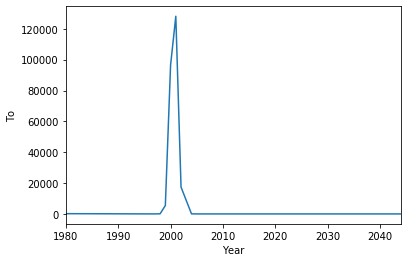

In [34]:
Year = Combined_df.groupby(Combined_df['Date'].dt.year)['To'].count().plot()
Year.set_xlabel('Year')
Year.set_ylabel('To')

In [35]:
Combined_df.groupby(Combined_df['Date'].dt.month)['To'].count()

Date
1     25290
2     18935
3     19979
4     22334
5     22627
6     15295
7     12012
8     13972
9     15302
10    29330
11    30054
12    22547
Name: To, dtype: int64

Text(0, 0.5, 'To')

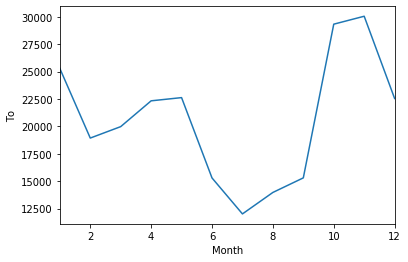

In [36]:
Year = Combined_df.groupby(Combined_df['Date'].dt.month)['To'].count().plot()
Year.set_xlabel('Month')
Year.set_ylabel('To')

In [37]:
Day=Combined_df.groupby(Combined_df['Date'].dt.weekday)['To'].count()

In [38]:
#0 is Monday
Day.head(10)

Date
0    46952
1    50802
2    51213
3    46302
4    42951
5     4332
6     5125
Name: To, dtype: int64

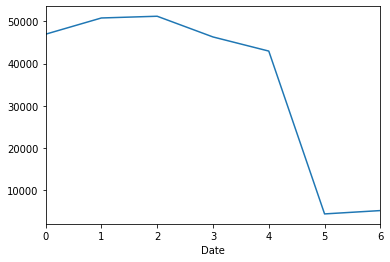

In [39]:
Day.plot()


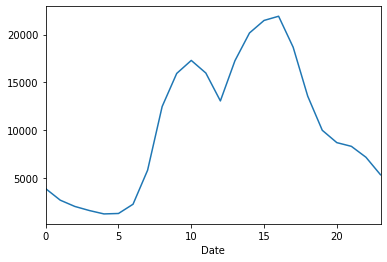

In [40]:
Hour=Combined_df.groupby(Combined_df['Date'].dt.hour)['To'].count()
Hour.plot()

In [41]:
Hour.head()

Date
0    3857
1    2651
2    1995
3    1566
4    1212
Name: To, dtype: int64

In [42]:
Combined_df['Month']=Combined_df['Date'].dt.month

In [43]:
Combined_df.head()

,Name,Type,Num,date,From,To,Subject,Mime-Version,Content-Type,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,Date,Month
0,allen-p,_sent_mail,10.,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,1.0,text/plain; charset=us-ascii,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,2001-05-04 20:51:00+00:00,5
1,allen-p,_sent_mail,1000.,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,,1.0,text/plain; charset=us-ascii,Phillip K Allen,Randall L Gay,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-10-23 13:13:00+00:00,10
2,allen-p,_sent_mail,1002.,"Thu, 31 Aug 2000 04:17:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,1.0,text/plain; charset=us-ascii,Phillip K Allen,Greg Piper,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-08-31 11:17:00+00:00,8
3,allen-p,_sent_mail,1004.,"Fri, 14 Jul 2000 06:59:00 -0700 (PDT)",phillip.allen@enron.com,joyce.teixeira@enron.com,Re: PRC review - phone calls,1.0,text/plain; charset=us-ascii,Phillip K Allen,Joyce Teixeira,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-07-14 13:59:00+00:00,7
4,allen-p,_sent_mail,102.,"Mon, 16 Oct 2000 06:44:00 -0700 (PDT)",phillip.allen@enron.com,zimam@enron.com,FW: fixed forward or other Collar floor gas pr...,1.0,text/plain; charset=us-ascii,Phillip K Allen,zimam@enron.com,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-10-16 13:44:00+00:00,10


In [44]:
FMD_df = Combined_df[['From', 'Month', 'Date']].dropna()
print(FMD_df.shape)

(258700, 3)


In [45]:
FMD_df =  FMD_df.groupby(['From', 'Month']).count().reset_index()
FMD_df.rename(columns={'Date': 'count'}, inplace=True)
FMD_df.sort_values(by=['count'], ascending=False) .head()

,From,Month,count
25416,pete.davis@enron.com,4,2182
24194,no.address@enron.com,10,1371
25413,pete.davis@enron.com,1,1103
17255,kay.mann@enron.com,4,1095
33435,vince.kaminski@enron.com,4,1079


In [46]:
FMD_df.loc[FMD_df['Month'] == 1].max()

From     zljp06a@prodigy.com
Month                      1
count                   1103
dtype: object

In [47]:
FMD_df.loc[FMD_df['Month'] == 12].max()

From     zvo2z17d0@untappedmarkets.com
Month                               12
count                              913
dtype: object

In [48]:
TMD_df = Combined_df[['To', 'Month', 'Date']].dropna()
print(TMD_df.shape)

(247677, 3)


In [49]:
TMD_df =  TMD_df.groupby(['To', 'Month']).count().reset_index()
TMD_df.rename(columns={'Date': 'count'}, inplace=True)
TMD_df.sort_values(by=['count'], ascending=False) .head()

,To,Month,count
47288,pete.davis@enron.com,4,2182
47285,pete.davis@enron.com,1,1103
34650,klay@enron.com,1,579
60080,tana.jones@enron.com,5,468
32697,kay.mann@enron.com,5,434


In [50]:
Combined_df['Hour']=Combined_df['Date'].dt.hour
FMHD = FMHD_df = Combined_df[['From', 'Month', 'Hour','Date']].dropna()
FMHD_df =  FMHD_df.groupby(['From', 'Month', 'Hour']).count().reset_index()
FMHD_df.rename(columns={'Date': 'count'}, inplace=True)
FMHD_df.sort_values(by=['count'], ascending=False) .head()

,From,Month,Hour,count
58164,outlook.team@enron.com,6,23,508
57351,no.address@enron.com,10,4,354
22177,enron.announcements@enron.com,11,18,289
57350,no.address@enron.com,10,3,229
57364,no.address@enron.com,10,21,196


In [51]:
FTD_df = Combined_df[['From', 'To', 'Date']].dropna()
print(FTD_df.shape)

(247677, 3)


In [52]:
FTD_df.To

0            john.lavorato@enron.com
1              randall.gay@enron.com
2               greg.piper@enron.com
3           joyce.teixeira@enron.com
4                    zimam@enron.com
                     ...            
258695          lon.draper@enron.com
258696             jzufferli@shaw.ca
258697    livia_zufferli@monitor.com
258698       john.lavorato@enron.com
258699        jeanie.slone@enron.com
Name: To, Length: 247677, dtype: object

In [53]:
FTD_df.groupby(['From', 'To']).count().reset_index()

,From,To,Date
0,'todd'.delahoussaye@enron.com,"derek.bailey@enron.com, jean.bell@enron.com, r...",1
1,'todd'.delahoussaye@enron.com,"derek.bailey@enron.com, jean.bell@enron.com, r...",2
2,--migrated--dodle@ercot.com,set@ercot.com,1
3,-nikole@excite.com,bill.williams@enron.com,1
4,-persson@ricemail.ricefinancial.com,barry.tycholiz@enron.com,2
...,...,...,...
76402,zulie.flores@enron.com,"marla.barnard@enron.com, cynthia.barrow@enron....",1
76403,zvo2z17d0@untappedmarkets.com,undisclosed-recipients@enron.com,1
76404,zwharton@dawray.com,martin.cuilla@enron.com,7
76405,zwharton@dawray.com,mcuilla@enron.com,7


In [54]:
FTD_df =  FTD_df.groupby(['From', 'To']).count().reset_index()
FTD_df.rename(columns={'Date': 'count'}, inplace=True)
FTD_df.sort_values(by=['count'], ascending=False) .head()

,From,To,count
55327,pete.davis@enron.com,pete.davis@enron.com,4538
74965,vince.kaminski@enron.com,vkaminski@aol.com,2105
19963,enron.announcements@enron.com,all.worldwide@enron.com,1146
19954,enron.announcements@enron.com,all.houston@enron.com,865
37660,kay.mann@enron.com,suzanne.adams@enron.com,764


In [55]:
FDT_df = Combined_df[['From', 'Date', 'To']].dropna()
print(FDT_df.shape)

(247677, 3)


In [56]:
FDT_df =  FDT_df.groupby(['From', 'Date']).count().reset_index()
FDT_df.rename(columns={'To': 'count'}, inplace=True)
FDT_df.sort_values(by=['count'], ascending=False) .head()

,From,Date,count
121271,public.relations@enron.com,2000-12-13 14:34:00+00:00,55
40317,enron.announcements@enron.com,2000-12-13 06:01:00+00:00,46
5022,announcements.enron@enron.com,2001-12-28 17:04:54+00:00,42
40559,enron.announcements@enron.com,2001-05-07 22:20:00+00:00,41
40267,enron.announcements@enron.com,2000-11-13 18:46:00+00:00,41


# Phase 3

In [57]:
Combined_df['X-cc'].groupby(Combined_df['X-cc']=='').count()

X-cc
False     64192
True     194497
Name: X-cc, dtype: int64

In [58]:
data = Combined_df.dropna(subset=['To'])
print (data)

              Name        Type    Num                                   date  \
0          allen-p  _sent_mail    10.   Fri, 4 May 2001 13:51:00 -0700 (PDT)   
1          allen-p  _sent_mail  1000.  Mon, 23 Oct 2000 06:13:00 -0700 (PDT)   
2          allen-p  _sent_mail  1002.  Thu, 31 Aug 2000 04:17:00 -0700 (PDT)   
3          allen-p  _sent_mail  1004.  Fri, 14 Jul 2000 06:59:00 -0700 (PDT)   
4          allen-p  _sent_mail   102.  Mon, 16 Oct 2000 06:44:00 -0700 (PDT)   
...            ...         ...    ...                                    ...   
258695  zufferli-j  sent_items    90.   Wed, 5 Dec 2001 06:22:58 -0800 (PST)   
258696  zufferli-j  sent_items    92.  Fri, 30 Nov 2001 14:53:21 -0800 (PST)   
258697  zufferli-j  sent_items    94.  Thu, 29 Nov 2001 11:04:24 -0800 (PST)   
258698  zufferli-j  sent_items    96.  Wed, 28 Nov 2001 12:47:48 -0800 (PST)   
258699  zufferli-j  sent_items    98.  Tue, 27 Nov 2001 11:52:45 -0800 (PST)   

                           From        

In [59]:
top_20 = pd.DataFrame(Combined_df["From"].value_counts()[:20])
top_20.reset_index(inplace=True)
top_20.columns = ["From", "count"] 

In [60]:
top_20.head()

,From,count
0,kay.mann@enron.com,8374
1,vince.kaminski@enron.com,7133
2,jeff.dasovich@enron.com,5746
3,pete.davis@enron.com,4540
4,enron.announcements@enron.com,4387


In [61]:
data.head()

,Name,Type,Num,date,From,To,Subject,Mime-Version,Content-Type,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,Date,Month,Hour
0,allen-p,_sent_mail,10.,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,1.0,text/plain; charset=us-ascii,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,2001-05-04 20:51:00+00:00,5,20
1,allen-p,_sent_mail,1000.,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,,1.0,text/plain; charset=us-ascii,Phillip K Allen,Randall L Gay,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-10-23 13:13:00+00:00,10,13
2,allen-p,_sent_mail,1002.,"Thu, 31 Aug 2000 04:17:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,1.0,text/plain; charset=us-ascii,Phillip K Allen,Greg Piper,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-08-31 11:17:00+00:00,8,11
3,allen-p,_sent_mail,1004.,"Fri, 14 Jul 2000 06:59:00 -0700 (PDT)",phillip.allen@enron.com,joyce.teixeira@enron.com,Re: PRC review - phone calls,1.0,text/plain; charset=us-ascii,Phillip K Allen,Joyce Teixeira,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-07-14 13:59:00+00:00,7,13
4,allen-p,_sent_mail,102.,"Mon, 16 Oct 2000 06:44:00 -0700 (PDT)",phillip.allen@enron.com,zimam@enron.com,FW: fixed forward or other Collar floor gas pr...,1.0,text/plain; charset=us-ascii,Phillip K Allen,zimam@enron.com,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,2000-10-16 13:44:00+00:00,10,13


In [62]:
Sinfo= pd.DataFrame()
Sinfo['From'] = data['From']
Sinfo['To'] = data['To']
Sinfo.head()

,From,To
0,phillip.allen@enron.com,john.lavorato@enron.com
1,phillip.allen@enron.com,randall.gay@enron.com
2,phillip.allen@enron.com,greg.piper@enron.com
3,phillip.allen@enron.com,joyce.teixeira@enron.com
4,phillip.allen@enron.com,zimam@enron.com


In [63]:
len(Sinfo['To'].unique())


44420

In [64]:
len(Combined_df['X-Origin'].unique())

260

In [65]:
import networkx as nx
G_symmetric = nx.Graph()

In [66]:
Sinfo.head()

,From,To
0,phillip.allen@enron.com,john.lavorato@enron.com
1,phillip.allen@enron.com,randall.gay@enron.com
2,phillip.allen@enron.com,greg.piper@enron.com
3,phillip.allen@enron.com,joyce.teixeira@enron.com
4,phillip.allen@enron.com,zimam@enron.com


In [67]:
Undirected_G_main=nx.from_pandas_edgelist(Sinfo, 'From', 'To') 


In [68]:
Directed_G_TO_From=nx.from_pandas_edgelist(Sinfo, 'To', 'From', create_using=nx.DiGraph()) 

In [69]:
Directed_G_From_TO=nx.from_pandas_edgelist(Sinfo, 'From', 'To', create_using=nx.DiGraph()) 

In [70]:
len(Undirected_G_main['randall.gay@enron.com'])

70

In [71]:
print(nx.info(Undirected_G_main))

Name: 
Type: Graph
Number of nodes: 53210
Number of edges: 70447
Average degree:   2.6479


In [145]:
plt.figure(figsize=(20,20))
pos = nx.spring_layout(Undirected_G_main, k=.1)
nx.draw_networkx(Undirected_G_main, pos, node_size=25, node_color='red', with_labels=True, edge_color='blue')
plt.show()

MemoryError: Unable to allocate array with shape (53210, 53210) and data type float64

<Figure size 1440x1440 with 0 Axes>

In [72]:
leaderboard = {}
for x in Undirected_G_main.nodes:
    leaderboard[x] = len(Undirected_G_main[x])
s = pd.Series(leaderboard, name='connections')
df2 = s.to_frame().sort_values('connections', ascending=False)

In [73]:
df2.head()

,connections
jeff.dasovich@enron.com,1461
tana.jones@enron.com,1070
sara.shackleton@enron.com,1050
chris.germany@enron.com,1000
kay.mann@enron.com,931


In [74]:
leaderboard = {}
for x in Directed_G_From_TO.nodes:
    leaderboard[x] = len(Directed_G_From_TO[x])
s = pd.Series(leaderboard, name='connections')
FT_G = s.to_frame().sort_values('connections', ascending=False)

In [75]:
FT_G.head()

,connections
jeff.dasovich@enron.com,1318
chris.germany@enron.com,940
tana.jones@enron.com,931
kay.mann@enron.com,874
sara.shackleton@enron.com,862


In [76]:
leaderboard = {}
for x in Directed_G_TO_From.nodes:
    leaderboard[x] = len(Directed_G_TO_From[x])
s = pd.Series(leaderboard, name='connections')
TF_G = s.to_frame().sort_values('connections', ascending=False)

In [77]:
TF_G.head()

,connections
klay@enron.com,663
sara.shackleton@enron.com,435
tana.jones@enron.com,421
jeff.dasovich@enron.com,403
kenneth.lay@enron.com,365


In [78]:
len(df2)

53210

In [79]:
df2['connections'].max()

1461

In [80]:
#find the person with the highest 

df2.loc[df2['connections'] == 1461]

,connections
jeff.dasovich@enron.com,1461


In [81]:
Undirected_G_main['randall.gay@enron.com']

AtlasView({'phillip.allen@enron.com': {}, 'daren.farmer@enron.com': {}, 'donna.greif@enron.com': {}, 'jacqueline.adams@enron.com, natalie.baker@enron.com, stacey.brewer@enron.com, \n\tsuzanne.christiansen@enron.com, brenda.everett@enron.com, \n\tdenise.squirrel@enron.com, patti.sullivan@enron.com, \n\tmorgan.sharifi@enron.com': {}, 'jennifer.blay@enron.com': {}, 'toni.graham@enron.com': {}, 'jennifer.denny@enron.com': {}, 'robert.superty@enron.com': {}, 'george.smith@enron.com': {}, 'morgan.sharifi@enron.com, denise.squirrel@enron.com, natalie.baker@enron.com, \n\tjacqueline.adams@enron.com, stacey.brewer@enron.com, \n\tsuzanne.christiansen@enron.com, brenda.everett@enron.com, \n\tkim.olinger@enron.com, patti.sullivan@enron.com': {}, 'anitareed@aol.com': {}, 'stephanie.miller@enron.com, jane.tholt@enron.com': {}, 'jay.reitmeyer@enron.com': {}, 'rob.gay@enron.com': {}, 'jacqueline.adams@enron.com, stacey.brewer@enron.com, \n\tbrenda.carnahan@enron.com, suzanne.christiansen@enron.com, \n

In [82]:
first300 = Sinfo.head(300)

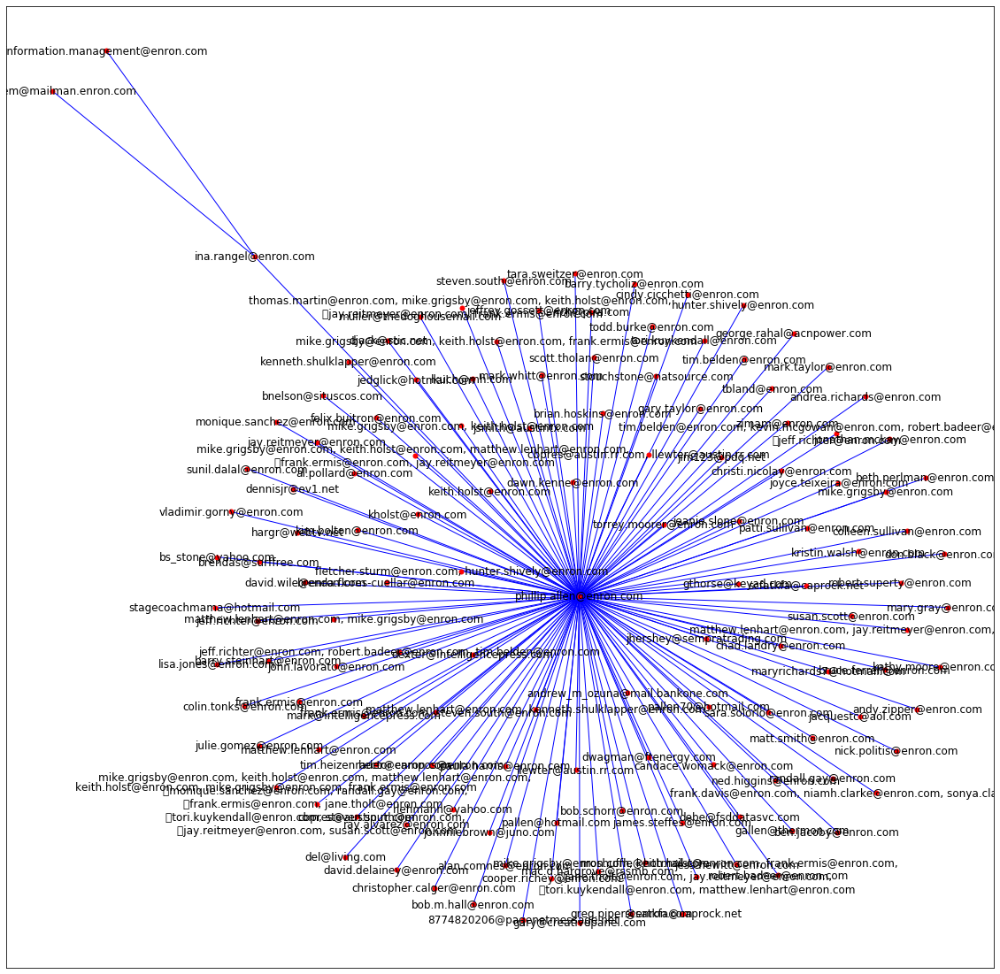

In [83]:
#Because of the number of connections the graph takes too long to process so we will be using the frist 300 to draw thwe graph
first300 = Sinfo.head(300)
G=nx.from_pandas_edgelist(first300, 'From', 'To') 
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(20,20))
pos = nx.spring_layout(G, k=.1)
nx.draw_networkx(G, pos, node_size=25, node_color='red', with_labels=True, edge_color='blue')
plt.show()

In [84]:
first300['From'].unique()

array(['phillip.allen@enron.com', 'ina.rangel@enron.com'], dtype=object)

In [85]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 135
Number of edges: 134
Average degree:   1.9852


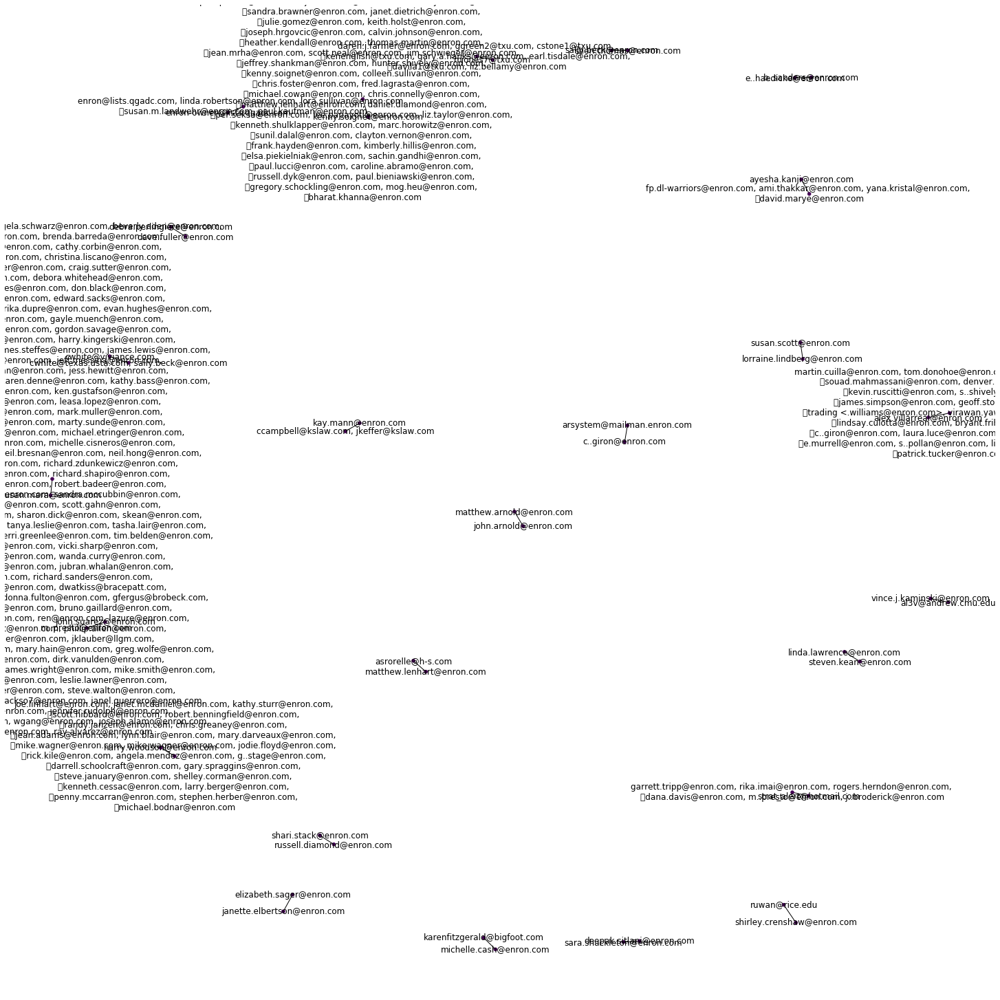

In [86]:
#- define the graph
G1 = nx.from_pandas_edgelist(data.sample(round(0.0001*len(data)), random_state = 0), "From", "To")

#- we define the closeness measure
closeness_G1 = nx.closeness_centrality(G1)
closeness_G1 = list(closeness_G1.values())

#- plot the network
plt.figure(figsize = (20,20))
pos1 = nx.spring_layout(G1, k=.1)
nx.draw(G1, pos1, node_size = 20, node_color = closeness_G1, with_labels = True)
plt.show()

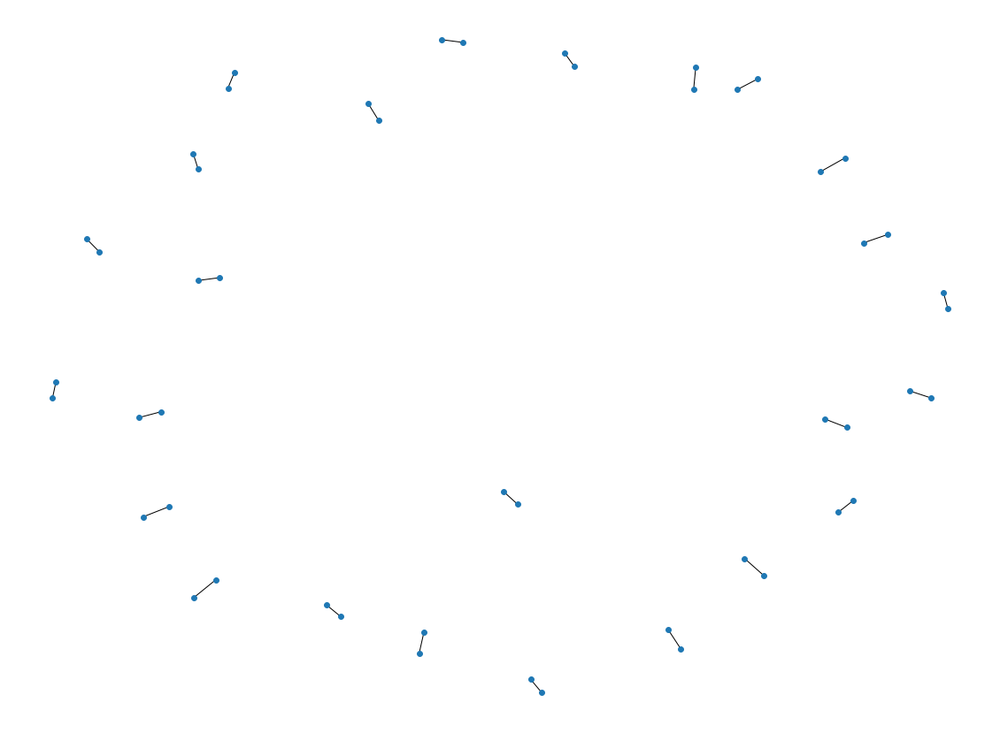

In [87]:
pos = nx.spring_layout(G1)
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (20, 15)
plt.axis('off')
nx.draw_networkx(G1, pos, with_labels = False, node_size = 35)
plt.show()

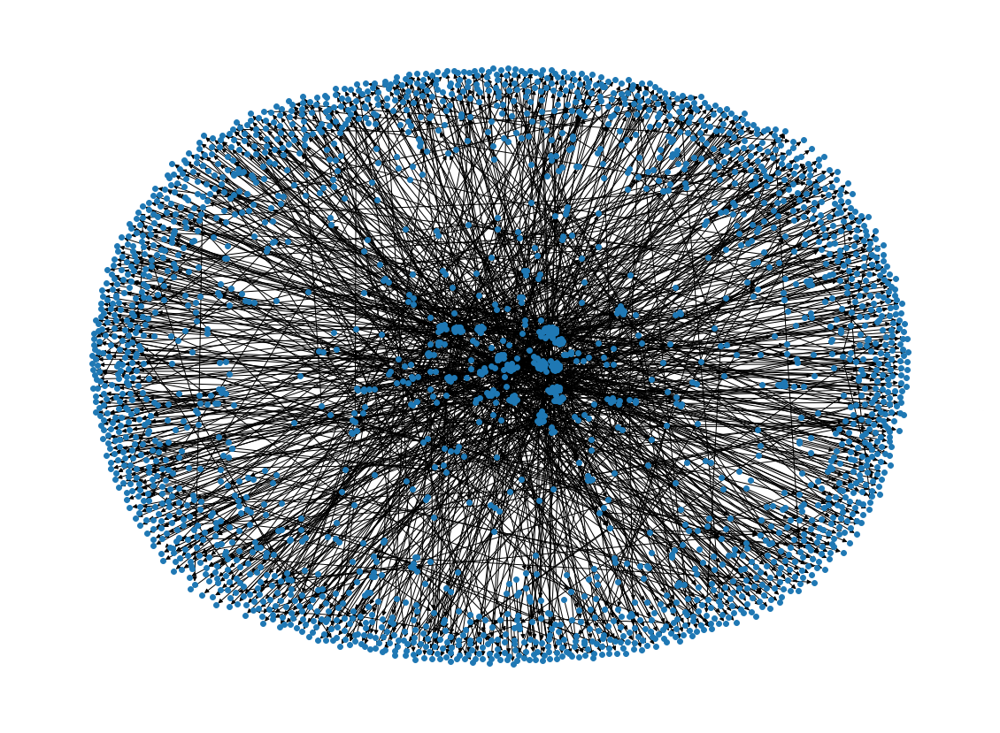

In [88]:
G2 = nx.from_pandas_edgelist(data.sample(round(0.01*len(data)), random_state = 0), "From", "To", create_using=nx.DiGraph())
pos = nx.spring_layout(G2)
plt.rcParams['figure.figsize'] = (20, 15)
plt.axis('off')
nx.draw_networkx(G2, pos, with_labels = False, node_size = 35)
plt.show()

In [89]:
print(nx.info(G2))

Name: 
Type: DiGraph
Number of nodes: 2461
Number of edges: 2164
Average in degree:   0.8793
Average out degree:   0.8793


In [90]:
dict

dict

In [91]:
for node, in_deg in dict(Directed_G_From_TO.in_degree).items():  
    print(node, in_deg)

phillip.allen@enron.com 20
john.lavorato@enron.com 196
randall.gay@enron.com 8
greg.piper@enron.com 16
joyce.teixeira@enron.com 1
zimam@enron.com 1
stagecoachmama@hotmail.com 1
keith.holst@enron.com 29
paula.harris@enron.com 5
tim.heizenrader@enron.com 13
ina.rangel@enron.com 26
stouchstone@natsource.com 5
lkuch@mh.com 1
kholst@enron.com 23
cindy.cicchetti@enron.com 1
christopher.calger@enron.com 14
kathy.moore@enron.com 5
james.steffes@enron.com 64
pallen70@hotmail.com 6
jsmith@austintx.com 2
moshuffle@hotmail.com 7
thomas.martin@enron.com, mike.grigsby@enron.com, keith.holst@enron.com, 
	jay.reitmeyer@enron.com, frank.ermis@enron.com 1
dexter@intelligencepress.com 2
rich@pira.com 1
debe@fsddatasvc.com 1
muller@thedoghousemail.com 1
mark@intelligencepress.com 1
bs_stone@yahoo.com 1
alan.comnes@enron.com 24
colleen.sullivan@enron.com 19
bruce.ferrell@enron.com 2
mac.d.hargrove@rssmb.com 2
cooper.richey@enron.com 43
sunil.dalal@enron.com 5
barry.steinhart@enron.com 1
lisa.jones@enron.co

julie.meyers@enron.com 18
ami.chokshi@enron.com, kyle.lilly@enron.com 1
selliott@dttus.com 1
michael.walters@enron.com, david.baumbach@enron.com, 
	o'neal.winfree@enron.com, bryan.hull@enron.com 1
david.baumbach@enron.com, brian.hoskins@enron.com, hector.campos@enron.com, 
	lenine.jeganathan@enron.com 1
bryan.hull@enron.com, o'neal.winfree@enron.com, david.baumbach@enron.com, 
	michael.walters@enron.com 1
steve.venturatos@enron.com 6
shelliott@dttus.com 2
phillip.love@enron.com 28
janie.aguayo@enron.com 5
shanna.husser@enron.com, dfranklin@hanovermeasurement.com, 
	jason.bass2@compaq.com, daphneco64@bigplanet.com, 
	lwbthemarine@bigplanet.com 1
michael.walters@enron.com, o'neal.winfree@enron.com, bryan.hull@enron.com 1
greg.couch@enron.com 8
jbass@stdauto.com 1
shanna.husser@enron.com 3
mike.wellings@enron.com 2
gary.lamphier@enron.com 12
lwbthemarine@bigplanet.com 2
timothy.blanchard@enron.com, bryan.hull@enron.com, matthew.lenhart@enron.com, 
	brian.hoskins@enron.com, luis.mena@enron

dennis.brown@enron.com 0
don.baughman@enron.com, juan.hernandez@enron.com, l..garcia@enron.com, 
	dean.laurent@enron.com 2
david.h.mendez@dynegy.com 0
don_baughman@enron.com 2
don.baughman@enron.com, kayne.coulter@enron.com, m..forney@enron.com, 
	juan.hernandez@enron.com 1
zarin.imam@enron.com 1
john.zurita@enron.com 2
joseph.capasso@enron.com 0
kirit.purbhoo@enron.com 1
karen.buckley@enron.com, doug.gilbert-smith@enron.com, 
	stacey.white@enron.com, don.baughman@enron.com, 
	harry.arora@enron.com, dana.davis@enron.com, 
	rogers.herndon@enron.com, david.gossett@enron.com, 
	chris.gaskill@enron.com, robert.superty@enron.com, 
	fred.lagrasta@enron.com, ed.mcmichael@enron.com, 
	scott.neal@enron.com 1
juan.hernandez@enron.com, don.baughman@enron.com 5
don.baughman@enron.com, rudy.acevedo@enron.com, juan.hernandez@enron.com, 
	paul.thomas@enron.com 1
rudy.acevedo@enron.com, juan.hernandez@enron.com, paul.thomas@enron.com, 
	don.baughman@enron.com 1
don.baughman@enron.com, juan.hernandez@e

	alvarado.estella@enron.com, agold.terri@enron.com 1
m.hall@enron.com 8
tana.cashion@enron.com, jeanie.slone@enron.com 1
sally.beck@enron.com, greg.piper@enron.com 2
sally.beck@enron.com, e..moscoso@enron.com, j..hanson@enron.com, 
	sam.leuschen@enron.com, l..davis@enron.com 1
john.lavorato@enron.com, wes.colwell@enron.com, david.port@enron.com, 
	rick.buy@enron.com, s..bradford@enron.com, sally.beck@enron.com, 
	m.hall@enron.com, jay.webb@enron.com, jenny.rub@enron.com 1
jeffrey.gossett@enron.com, kam.keiser@enron.com, stacey.white@enron.com, 
	peggy.hedstrom@enron.com, brent.price@enron.com, 
	brenda.herod@enron.com, martha.stevens@enron.com, 
	wanda.curry@enron.com, meredith.eggleston@enron.com, 
	barry.pearce@enron.com, kristin.albrecht@enron.com, 
	david.maxwell@enron.com, chris.abel@enron.com, 
	shona.wilson@enron.com, ted.murphy@enron.com, 
	cassandra.schultz/na/enron@enron.com, mike.jordan@enron.com 1
bill.hare@enron.com, mary.gosnell@enron.com, connie.sutton@enron.com, 
	judy.

jerry.graves@enron.com, shana.farrow@enron.com, team.tate@enron.com 1
w..mcgowan@enron.com, steve.kirk@enron.com, steve.january@enron.com 1
harry.woodson@enron.com, john.buchanan@enron.com, terry.kowalke@enron.com, 
	gary.spraggins@enron.com 1
jodie.floyd@enron.com, frank.semin@enron.com 1
steve.january@enron.com, janet.bowers@enron.com, steve.kirk@enron.com, 
	l..johnson@enron.com 1
chris.sebesta@enron.com, jodie.floyd@enron.com 1
harry.woodson@enron.com, raetta.zadow@enron.com, alice.johnson@enron.com, 
	rick.dietz@enron.com 1
chris.sebesta@enron.com, larry.berger@enron.com, e-mail <'.'jeff@enron.com> 1
w..mcgowan@enron.com, steve.january@enron.com 1
vernon.mercaldo@enron.com, jean.adams@enron.com, john.buchanan@enron.com, 
	g..stage@enron.com 1
debra.scurlock@enron.com 1
dave.neubauer@enron.com, jo.williams@enron.com, g..stage@enron.com, 
	mary.darveaux@enron.com, dari.dornan@enron.com 1
patrick.barry@enron.com, jean.blair@enron.com, randy.bryan@enron.com, 
	nancy.callans@enron.com,

louis.soldano@enron.com, charlie.graham@enron.com 1
l..eisenstein@enron.com 1
gaby.adamek@enron.com, betty.alexander@enron.com, larry.campbell@enron.com, 
	james.centilli@enron.com, earl.chanley@enron.com, 
	steve.crabtree@enron.com, l..eisenstein@enron.com, 
	team.flagstaff-sta2@enron.com, team.flagstaff-sta3@enron.com, 
	morgan.gottsponer@enron.com, steven.harris@enron.com, 
	scott.hill@enron.com, debbie.hinkle@enron.com, lisa.honey@enron.com, 
	dave.hubbard@enron.com, todd.ingalls@enron.com, 
	kathy.jameson@enron.com, rich.jolly@enron.com, 
	steve.kalmus@enron.com, team.kingman-sta1@enron.com, 
	lorraine.lindberg@enron.com, phil.lowry@enron.com, 
	gary.maestas@enron.com, donna.martens@enron.com, d..martin@enron.com, 
	mike.mccracken@enron.com, rick.perkins@enron.com, 
	dan.pribble@enron.com, byron.rance@enron.com, 
	david.roensch@enron.com, rinetia.turner@enron.com, 
	kimberly.watson@enron.com, mark.lavine@enron.com 1
krobb@hunton.com 0
br5ply89gkv9@hotmail.com 0
ayg2jtsznys1q@hotma

andy_edling@kindermorgan.com 0
'erb@enron.com, kerb@houston.deepwater.com, velardeanita@msn.com, 
	edling@enron.com, andy_edling@kindermorgan.com, mkudla@aol.com, 
	cjdick@pdq.net, ghemphill82@msn.com, itorras@hal-pc.org, 
	jordanas@mindspring.com, rbwalljr@ix.netcom.com, scorman@enron.com, 
	simflower13@aol.com, themphill@teppco.com 1
cjdick@pdq.net 1
erb@enron.com, kerb@houston.deepwater.com, velardeanita@msn.com, 
	andy_edling@kindermorgan.com, mkudla@aol.com, ghemphill82@msn.com, 
	itorras@hal-pc.org, jordanas@mindspring.com, rbwalljr@ix.netcom.com, 
	scorman@enron.com, simflower13@aol.com, themphill@teppco.com 1
blt12139@aol.com 1
shelley.corman@enron.com, theresa.hess@enron.com 1
joanne.bisbee@enron.com, andy.brady@enron.com, hasan.kedwaii@enron.com, 
	wendy.koh@enron.com, jeanne.licciardo@enron.com 1
ellis.stern@enron.com, caroline.barnes@enron.com, john.buchanan@enron.com, 
	gary.spraggins@enron.com, terry.kowalke@enron.com, 
	darrell.schoolcraft@enron.com, lisa.sawyer@enron.co

	athomas@newenergy.com 1
sabina@email.msn.com 0
jmh@cpuc.ca.gov 1
343011.18905264.2@lists.economist.com 0
joseph.alamo@enron.com, susan.mara@enron.com, sandra.mccubbin@enron.com, 
	jeff.dasovich@enron.com, mona.petrochko@enron.com, 
	alan.comnes@enron.com 1
steven.kean@enron.com, jeff.dasovich@enron.com 3
kortney.brown@enron.com, jeff.dasovich@enron.com, 
	robert.neustaedter@enron.com, harry.kingerski@enron.com, 
	james.steffes@enron.com 1
gus.perez@enron.com 0
ann.schmidt@enron.com, bryan.seyfried@enron.com, elizabeth.linnell@enron.com, 
	filuntz@aol.com, james.steffes@enron.com, janet.butler@enron.com, 
	jeannie.mandelker@enron.com, jeff.dasovich@enron.com, 
	joe.hartsoe@enron.com, john.neslage@enron.com, 
	john.sherriff@enron.com, joseph.alamo@enron.com, 
	karen.denne@enron.com, lysa.akin@enron.com, mark.palmer@enron.com, 
	mark.schroeder@enron.com, markus.fiala@enron.com, 
	michael.brown@enron.com, mona.petrochko@enron.com, 
	nicholas.o'day@enron.com, peggy.mahoney@enron.com, 
	pet

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1
sara.shackleton@enron.com, samantha.boyd@enron.com, mary.cook@enron.com, 
	n..gray@enron.com, marie.heard@enron.com, brent.hendry@enron.com, 
	tana.jones@enron.com, c..koehler@enron.com, pinto.leite@enron.com, 
	legal <.taylor@enron.com>, stephanie.panus@enron.com, 
	frank.sayre@enron.com, susan.bailey@enron.com 1
annette.rosario@db.com 1
n..gray@enron.com, kay.mann@enron.com, tana.jones@enron.com 1
geordie_hochbaum@transalta.com 0
kabarrie@hotmail.com 1
wendi.lebrocq@enron.com, karen.lambert@enron.com, tana.jones@enron.com, 
	samuel.schott@enron.com, r..brackett@enron.com, 
	cynthia.clark@enron.com, counterparty.enron@enron.com, 
	stephanie.sever@enron.com, tom.moran@enron.com, 
	claudia.clark@enron.com, s..bradford@enron.com, lisa.lees@enron.com, 
	juana.fayett@enron.com, trang.le@enron.com, paul.maley@enron.com, 
	karen.o'day@enron.com, tanya.rohauer@enron.com, 
	kelly.lombardi@enron.com, brian.lindsay@enron.com, 
	center.eol@enron.com, d..hare@enron.com, amy.heffernan@enron.com, 

vkamins@enron.com, vkaminski@aol.com 1
jmccauley@shasta.phys.uh.edu 0
shirley.crenshaw@enron.com, pinsky@uh.edu 1
cclowes@risk.co.uk 0
walter.gontarek@royalbank.com, james.jordan@nera.com, vkamins@enron.com 1
elizabeth.grant@enron.com, kathy.mckay@enron.com 1
dale.surbey@enron.com, vince.kaminski@enron.com, grant.masson@enron.com, 
	stinson.gibner@enron.com, vasant.shanbhogue@enron.com, 
	benjamin.parsons@enron.com 1
jose.marquez@enron.com, kevin.moore@enron.com, joseph.hrgovcic@enron.com, 
	william.smith@enron.com 1
greg_j_ball@hotmail.com 1
vkamins@enron.com, grant.masson@enron.com 1
vince.kaminski@enron.com, stinson.gibner@enron.com, zimin.lu@enron.com, 
	grant.masson@enron.com, pinnamaneni.krishnarao@enron.com, 
	vasant.shanbhogue@enron.com, tanya.tamarchenko@enron.com 1
william.smith@enron.com, shirley.crenshaw@enron.com, andy.sikes@enron.com, 
	mike.roberts@enron.com 1
rajesh.sivaraman@enron.com, heidi.hellmann@enron.com 1
vince.kaminski@enron.com, dale.surbey@enron.com 2
william

kathy@downtowndistrict.org 1
james.steffes@enron.com, harry.kingerski@enron.com, 
	richard.shapiro@enron.com, dennis.benevides@enron.com, 
	james.wood@enron.com, martin.wenzel@enron.com, tom.riley@enron.com, 
	greg.cordell@enron.com, karen.denne@enron.com, mark.palmer@enron.com, 
	steven.kean@enron.com, chris.hendrix@enron.com, 
	gary.mirich@enron.com, george.waidelich@enron.com, 
	ronald.mentan@enron.com, mona.petrochko@enron.com 1
mark.palmer@enron.com, meredith.philipp@enron.com, karen.denne@enron.com, 
	steven.kean@enron.com 1
mark.palmer@enron.com, steven.j.kean@enron.com, karen.denne@enron.com 1
linda.breathitt@ferc.fed.us 1
charles.yeung@enron.com, christi.nicolay@enron.com, janice.moore@enron.com, 
	joe.hartsoe@enron.com, mary.hain@enron.com, 
	richard.shapiro@enron.com, ron.mcnamara@enron.com, 
	sarah.novosel@enron.com, steve.walton@enron.com, 
	tom.delaney@enron.com, steven.kean@enron.com, thresa.allen@enron.com, 
	edward.baughman@enron.com, oscar.dalton@enron.com, 
	patrick.

cindy.olson@enron.com, j..kean@enron.com 1
cindy.olson@enron.com, sharon.butcher@enron.com, kriste.sullivan@enron.com, 
	felecia.acevedo@enron.com, diane.goode@enron.com 1
mark.koenig@enron.com, j..kean@enron.com, kenneth.lay@enron.com 1
david.oxley@enron.com, gary.smith@enron.com, kalen.pieper@enron.com, 
	marla.barnard@enron.com, exec.jones@enron.com, mary.joyce@enron.com 1
rosalee.fleming@enron.com, kenneth.lay@enron.com, mark.koenig@enron.com, 
	paula.rieker@enron.com, j..kean@enron.com 1
ltaylor@heidrick.com 0
gloria.ogenyi@enron.com 2
j..kean@enron.com, maureen.mcvicker@enron.com, richard.shapiro@enron.com, 
	ginger.dernehl@enron.com, elizabeth.linnell@enron.com, 
	d..steffes@enron.com, pr <.palmer@enron.com> 1
jrr@vnf.com 0
lchurch@epsa.org 0
carolyn_l_green@sunoil.com 0
william.a.smith@elpaso.com 0
christiepatrick@msn.com 0
maureen.mcvicker@enron.com, j..kean@enron.com 1
richard.shapiro@enron.com, j..kean@enron.com 3
mark.metts@enron.com, jessica.uhl@enron.com, paul.puchot@enro

premierlg@ev1.net 1
custo@coair.com 1
diane_hoyuela@foleys.com 1
susan.hadix@elpaso.com 1
cathy_morse@foleys.com 1
pwesson@astraoil.com 1
terr.henderson@accenture.com 1
kacee.downey@enron.com 3
childproofer@aol.com 1
shaverh@aol.com 1
paulwes@swbell.net 0
pappadeas@mindspring.com, wportale@hotmail.com, walter_reade@fuse.net, 
	vthomas@mindspring.com, vartkesn@yahoo.com, tlatson@hotmail.com, 
	tkuyken@ect.enron.com, tgwood@utmb.edu, mustardblend@earthlink.net, 
	t_taft5@hotmail.com, tim@l2systems.com, tmccurry@sas.samsung.com, 
	taniashaus@aol.com, tamhaus@swbell.net, drhat@aol.com, 
	talevans@hotmail.com, msbroz@aol.com, steven_w_murray@hotmail.com, 
	ruminant@email.msn.com, otillar@ws-law.com, 
	steve.cupit@halliburton.com, sondra.a.ludwick@accenture.com, 
	knicksfan2@juno.com, sevg@hal-pc.org, shieldes@yahoo.com, 
	saorin@guitar.ocn.ne.jp, jlynch5@aol.com, 
	robert.j.baker@accenture.com, reza18@gateway.net, rcash49@aol.com, 
	oncodocr@aol.com, techasff@juno.com, manleypc@aol.com, 
	n

jverni4399@aol.com 0
billweller@aol.com 0
nanking1224@earthlink.net 0
kurtandrewkaiser@hotmail.com 0
mattstreit@hotmail.com 0
lisashears@yahoo.com 0
homunculus_2001@yahoo.com 0
pperry@sfts.edu 0
kquandt@onebox.com 0
alexis415@yahoo.com 0
bluehero@hotmail.com 0
fquebbemann@the-beach.net 0
jhb513@aol.com 0
jtnunemaker@yahoo.com 0
dsahearn@ucdavis.edu 0
full.throttle@bigfoot.com 0
mschulzsd@aol.com 0
charles@gcfonline.com 0
bildel@muze.com 0
megadood_2000@yahoo.com 0
lmilowe@scmc.org 0
kcschock@aol.com 0
mchiuten@twcny.rr.com 0
jhutchis@carbon.cudenver.edu 0
rebecca.goodman@aya.yale.edu 0
shuebox@u.washington.edu 0
lorna@netopia.com 0
dschneider@challiance.org 0
antoinetteml@yahoo.com 0
rachelhayes@writeme.com 0
baumank@yahoo.com 0
davidson@miami.edu 0
joanna@groupdesigninc.com 0
eric@aquaticandwetland.com 0
michaelmiller@mac.com 0
gamble111@yahoo.com 0
jim.steitz@usu.edu 0
scardozo@mindspring.com 0
david@smartstaffpersonnel.com 0
carolus@optonline.net 0
nishiko@pacbell.net 0
robberbaronu

	lindy.donoho@enron.com, lee.huber@enron.com, susan.scott@enron.com 1
cynthia.rivers@enron.com 2
north.america_europe@enron.com 1
colvin_craig@valic.com, eblansfield@ideon-inc.com, bgambrell@corestaff.com, 
	hank_kuczynski@valic.com, jose_beiro@agc.com, casafun@aol.com, 
	mreyna@agannuity.com, mlokay@enron.com, miller_randy@agc.com, 
	mitchp@atlantia.com, nick_allen37@hotmail.com, 
	ncomstock@ideon-inc.com, patwhitworth@hotmail.com, 
	mcravain@equilon.com, doug.wendler@enform.com 1
gpg.center@enron.com 0
steven.harris@enron.com, kevin.hyatt@enron.com, tk.lohman@enron.com, 
	jeffery.fawcett@enron.com, lorraine.lindberg@enron.com, 
	michelle.lokay@enron.com 1
jesse.alvarado@enron.com, roy.armitage@enron.com, rodney.barnes@enron.com, 
	richard.barry@enron.com, keith.braswell@enron.com, 
	sharon.brown@enron.com, steve.coash@enron.com, 
	jeffrey.cochran@enron.com, helen.cummings@enron.com, 
	michael.ellington@enron.com, margaret.hall@enron.com, 
	crandal.hardy@enron.com, gaynel.henley@enron

kristen.jurgens@enron.com 2
bill.askew@enron.com, don.baldridge@enron.com, brian.bawden@enron.com, 
	brian.bierbach@enron.com, bert.bloom@enron.com, j..bump@enron.com, 
	aaron.carnevale@enron.com, cat.braden@enron.com, 
	ken.choyce@enron.com, carla.dickenson@enron.com, 
	pat.downey@enron.com, tricia.flanigan@enron.com, 
	dixie.forrester@enron.com, rick.fresquez@enron.com, 
	michelle.gross@enron.com, james.hoff@enron.com, 
	james.jagau@enron.com, chris.jantz@enron.com, 
	kristen.jurgens@enron.com, michael.kolman@enron.com, 
	stephen.kusner@enron.com, ryan.lebsack@enron.com, 
	j..legler@enron.com, catrina.lucero@enron.com, 
	chris.martinez@enron.com, william.mathews@enron.com, 
	daniel.mcelhaney@enron.com, linda.mcnamee@enron.com, 
	patricia.mentor@enron.com, sue.norris@enron.com, 
	pierce.norton@enron.com, lisa.parada@enron.com, tim.pimmel@enron.com, 
	mick.rafter@enron.com, paul.ritzdorf@enron.com, 
	schlecht.schlecht@enron.com, andy.schroeder@enron.com, 
	david.scobel@enron.com, walt.

barbara.bennett@ssmb.com 0
william.keeney@enron.com, janelle.scheuer@enron.com, david.marks@enron.com, 
	jeffrey.miller@enron.com, tom.may@enron.com 1
e..jones@enron.com, kay.mann@enron.com 1
drunnels@akllp.com 1
nmann@erac.com, kay.mann@worldnet.att.net 1
stuart.zisman@enron.com, ron.tapscott@enron.com, ben.jacoby@enron.com, 
	chip.schneider@enron.com 1
heather.kroll@enron.com, charles.vetters@enron.com, c..koehler@enron.com, 
	dan.lyons@enron.com, suzanne.adams@enron.com, carlos.sole@enron.com 1
elizabeth.sager@enron.com, t..hodge@enron.com, legal <.schuler@enron.com> 1
rahil.jafry@enron.com, kathleen.carnahan@enron.com 1
recordp@southwestern.com 1
'ward@enron.com, sharonward@akllp.com 1
rahil'.'jafry@enron.com 1
heather.kroll@enron.com, elizabeth.sager@enron.com, rahil.jafry@enron.com 1
zachary.inman@enron.com 1
kayne.coulter@enron.com, rahil.jafry@enron.com 1
'deberry@enron.com, jeremiahdeberry@paulhastings.com 1
suzanne.adams@enron.com, alice.wright@enron.com 1
g..bushman@enron.co

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1
khou-weatherwarn@khou.weatherwarn.net 0
weatherwarn@mailman.enron.com, subscribers@mailman.enron.com 1
julia.murray@enron.com, travis.mccullough@enron.com, carol.st.@enron.com, 
	legal <.schuler@enron.com>, legal <.taylor@enron.com>, 
	b..sanders@enron.com, jordan.mintz@enron.com, 
	gareth.bahlmann@enron.com, joel.ephross@enron.com 1
405954.124936407.2@1.americanexpress.com 0
legal <.taylor@enron.com>, michelle.cash@enron.com 1
jeff.blumenthal@enron.com, susan.musch@enron.com, bjorn.hagelmann@enron.com, 
	tom.moran@enron.com, john.sweeny@enron.com, 
	legal <.taylor@enron.com> 1
legal <.taylor@enron.com>, fran.mayes@enron.com 1
dgarland@nymex.com 0
subs@optioninvestor.com 1
r..brackett@enron.com, s..bradford@enron.com, r..conner@enron.com, 
	genia.fitzgerald@enron.com, patrick.hanse@enron.com, 
	ann.murphy@enron.com, s..theriot@enron.com, greg.wolfe@enron.com, 
	christian.yoder@enron.com, j..miller@enron.com, steve.neal@enron.com, 
	s..olinger@enron.com, h..otto@enron.com, lee'.'papay

	eric.moon@enron.com, charles.weldon@enron.com 1
charles.weldon@enron.com, findley.steve@enron.com, 
	fairbrother.bill@enron.com, houston.kerri@enron.com, 
	powell.richard@enron.com, dickerson.paul@enron.com 1
eric.bass@enron.com, david.baumbach@enron.com, gary.bryan@enron.com, 
	jd.buss@enron.com, troy.denetsosie@enron.com, j..farmer@enron.com, 
	bryan.hull@enron.com, mark.knippa@enron.com, 
	morris.larubbio@enron.com, a..martin@enron.com, 
	michael.olsen@enron.com, joe.parks@enron.com, 
	brian.redmond@enron.com, linda.roberts@enron.com, 
	michael.salinas@enron.com, jim.schwieger@enron.com, 
	jay.smith@enron.com, charles.weldon@enron.com 1
tim.abasov@enron.com, nadeem.abdullah@enron.com, margaret.allen@enron.com, 
	jeff.bartlett@enron.com, lisa.best@enron.com, 
	jay.boudreaux@enron.com, billy.braddock@enron.com, 
	s..bradford@enron.com, j..broderick@enron.com, 
	paul.burkhart@enron.com, j..butler@enron.com, 
	guido.caranti@enron.com, daniel.castagnola@enron.com, 
	greg.caudell@enron.c

bill.williams@enron.com, cara.semperger@enron.com, tim.belden@enron.com 1
jeff.richter@enron.com, p..o'neil@enron.com, bill.williams@enron.com, 
	todd.perry@enron.com, h..foster@enron.com, laura.wente@enron.com 1
bill.iii@enron.com, tim.belden@enron.com, cara.semperger@enron.com, 
	amy.fitzpatrick@enron.com, debra.davidson@enron.com, 
	kathryn.sheppard@enron.com, anna.mehrer@enron.com, 
	kathy.axford@enron.com, grace.rodriguez@enron.com 1
heather.dunton@enron.com, kourtney.nelson@enron.com, bill.iii@enron.com, 
	monika.causholli@enron.com, holden.salisbury@enron.com, 
	lei.chen@enron.com, david.porter@enron.com, geir.solberg@enron.com, 
	bert.meyers@enron.com, julie.sarnowski@enron.com 1
bill.iii@enron.com, greg.wolfe@enron.com 1
bill.iii@enron.com, amy.fitzpatrick@enron.com 1
bill.iii@enron.com, cara.semperger@enron.com, tim.belden@enron.com 1
lysa.akin@enron.com, kathy.axford@enron.com, jessica.burry@enron.com, 
	debra.davidson@enron.com, mollie.gustafson@enron.com, 
	jan.king@enron.

Text(0.5, 0, 'Out-degrees')

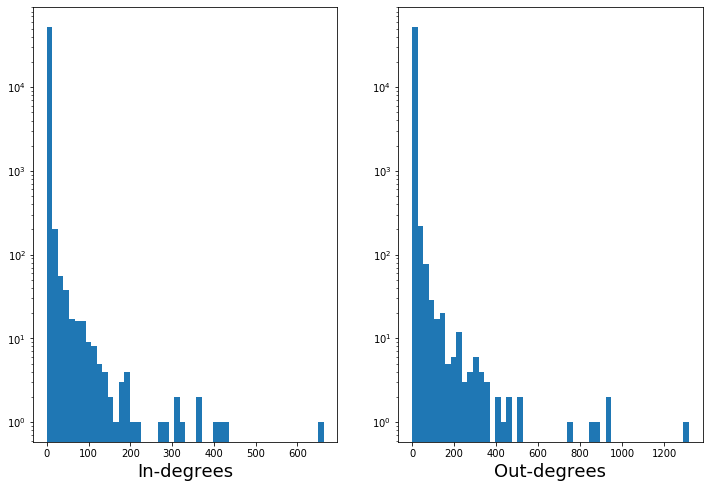

In [92]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 8))
ax1.hist(dict(Directed_G_From_TO.in_degree(weight='count')).values(), log=True, bins=50)
ax1.set_xlabel('In-degrees', fontsize=18)

ax2.hist(dict(Directed_G_From_TO.out_degree(weight='count')).values(), log=True, bins=50)
ax2.set_xlabel('Out-degrees', fontsize=18)

In [93]:
le = sklearn.preprocessing.LabelEncoder()
first300['From'] = le.fit_transform(first300['From'])
first300['To'] = le.fit_transform(first300['To'])
first300.head()

,From,To
0,1,66
1,1,108
2,1,48
3,1,69
4,1,133


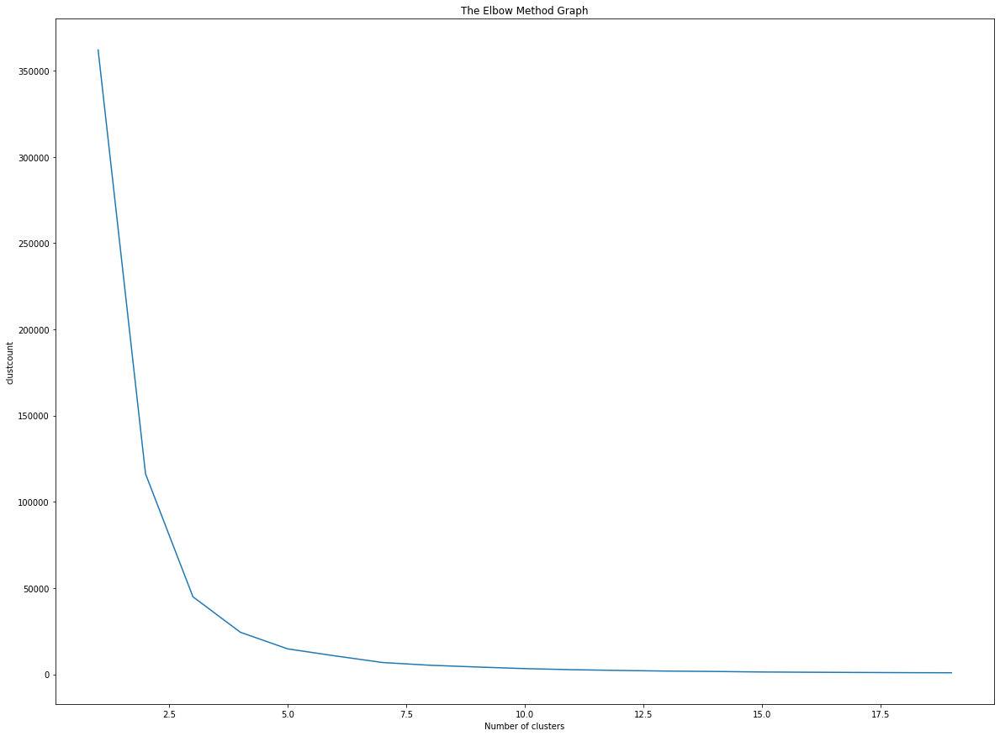

In [94]:
#Using the Elbow Method, Determine the number of clusters
clustcount=[]
for i in range(1,20): 
     kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=300,  n_init=10,random_state=0 )
     kmeans.fit(first300)
     clustcount.append(kmeans.inertia_)
plt.plot(range(1,20),clustcount)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('clustcount')
plt.show()

In [95]:
kmeans = KMeans(n_clusters=3, init ='k-means++', max_iter=300, n_init=10,random_state=0 )
y_kmeans = kmeans.fit_predict(first300)

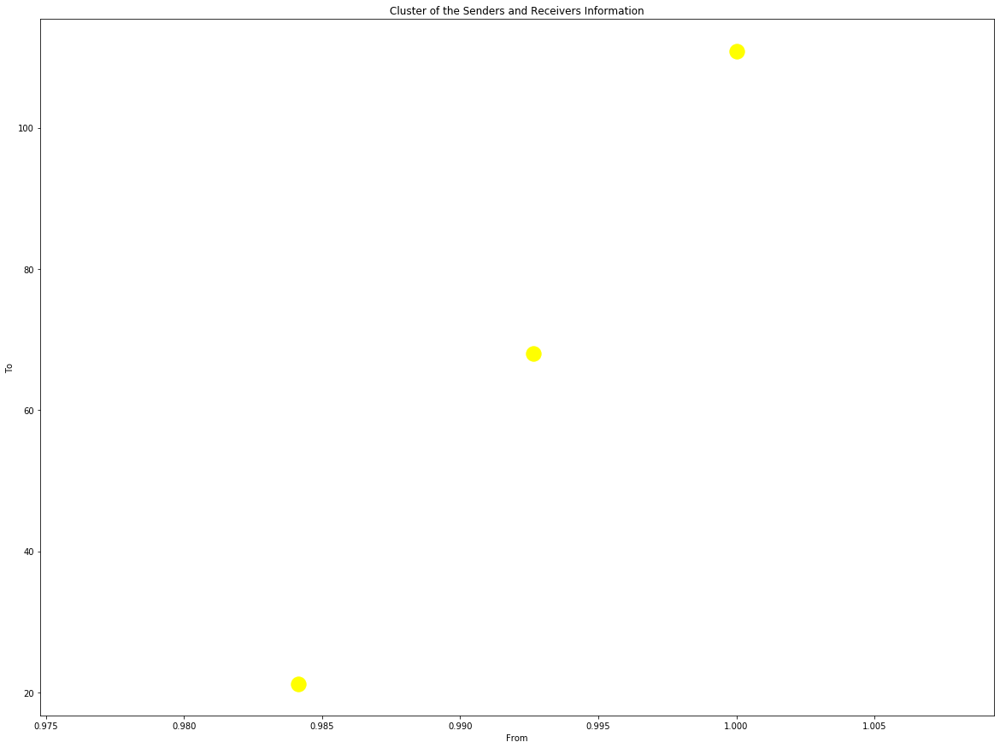

In [96]:
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label = 'Centroids')
plt.title('Cluster of the Senders and Receivers Information')
plt.xlabel('From')
plt.ylabel('To')
plt.show()

In [97]:
#randf_info = Sinfo.sample(n=10000)
r_info = Sinfo
le = sklearn.preprocessing.LabelEncoder()
r_info['From'] = le.fit_transform(Sinfo['From'])
r_info['To'] = le.fit_transform(Sinfo['To'])
r_info.head()

,From,To
0,11297,20311
1,11297,32910
2,11297,14851
3,11297,21048
4,11297,44389


In [188]:
clustcount=[]
for i in range(1,20): 
     kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=300,  n_init=10,random_state=0 )
     kmeans.fit(r_info)
     clustcount.append(kmeans.inertia_)
plt.plot(range(1,20),clustcount)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('clustcount')
plt.show()

KeyboardInterrupt: 

In [98]:
randf_info = Sinfo.sample(n=10000)
le = sklearn.preprocessing.LabelEncoder()
randf_info['From'] = le.fit_transform(randf_info['From'])
randf_info['To'] = le.fit_transform(randf_info['To'])
randf_info.head()

,From,To
40033,1126,3892
85238,2398,1469
59521,655,4831
159254,1373,661
36854,2474,3268


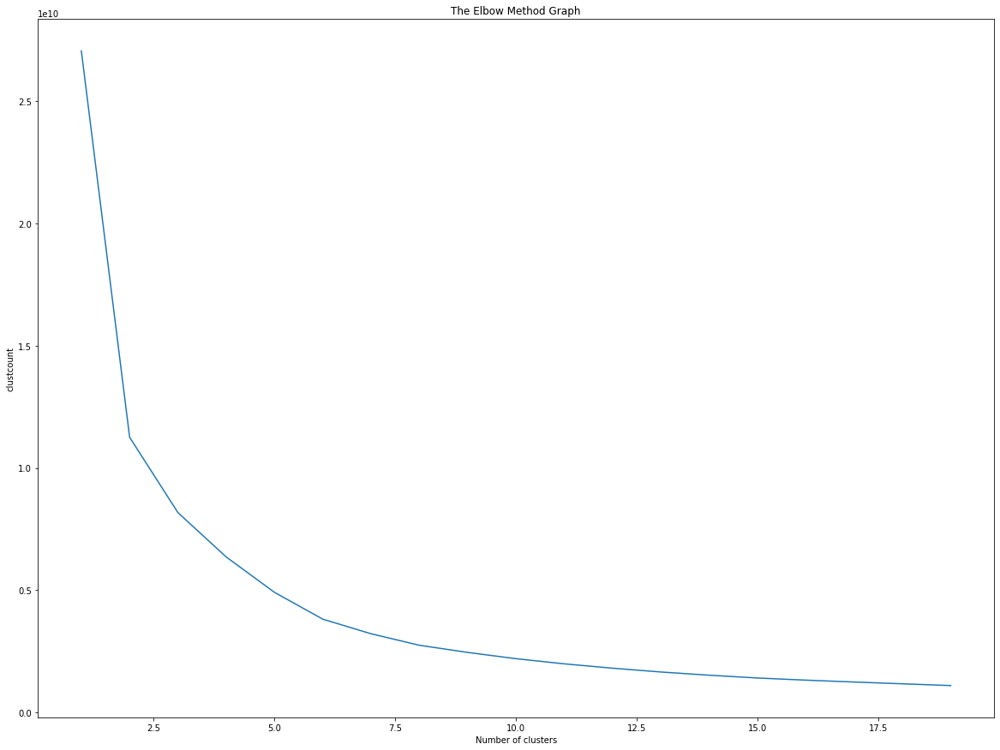

In [99]:
clustcount=[]
for i in range(1,20): 
     kmeans = KMeans(n_clusters=i, init ='k-means++', max_iter=300,  n_init=10,random_state=0 )
     kmeans.fit(randf_info)
     clustcount.append(kmeans.inertia_)
plt.plot(range(1,20),clustcount)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('clustcount')
plt.show()

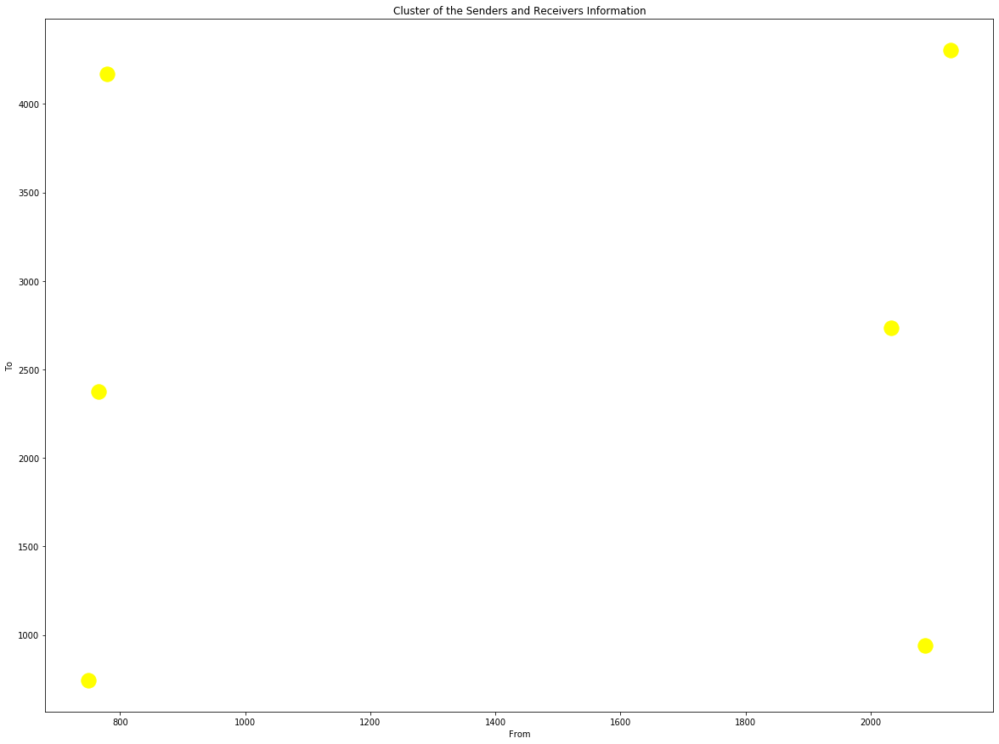

In [100]:
kmeans = KMeans(n_clusters=6, init ='k-means++', max_iter=300, n_init=10,random_state=0 )
y_kmeans = kmeans.fit_predict(randf_info)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label = 'Centroids')
plt.title('Cluster of the Senders and Receivers Information')
plt.xlabel('From')
plt.ylabel('To')
plt.show()

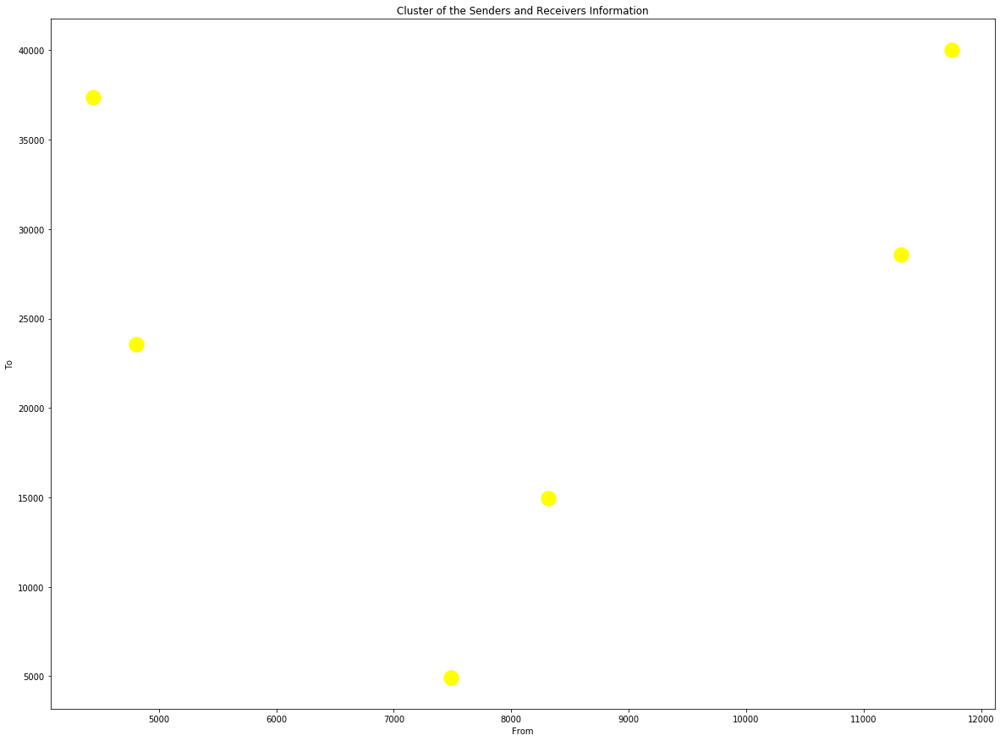

In [101]:
kmeans = KMeans(n_clusters=6, init ='k-means++', max_iter=300, n_init=10,random_state=0 )
y_kmeans = kmeans.fit_predict(r_info)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label = 'Centroids')
plt.title('Cluster of the Senders and Receivers Information')
plt.xlabel('From')
plt.ylabel('To')
plt.show()

Lets try some clustering on some other information in the dataset. the largeness of the dataset reults in a rather slow processing so for most of the data we will be using a random selection of 10,000

# Part 3 -Neural Net 

# Part 4 - Sentiment Analysis

In [102]:
data['Subject']

0                                                       Re:
1                                                          
2                                                 Re: Hello
3                              Re: PRC review - phone calls
4         FW: fixed forward or other Collar floor gas pr...
                                ...                        
258695                       FW: Positions without Sundance
258696                                                  RE:
258697                                                  RE:
258698                                           Gas Hedges
258699                            Calgary Analyst/Associate
Name: Subject, Length: 247677, dtype: object

In [103]:
import nltk
import re
from nltk.corpus import stopwords
stopWords = stopwords.words('english')

In [104]:
!pip install wordcloud

In [105]:
from sklearn.model_selection import train_test_split
from nltk.classify import SklearnClassifier
from wordcloud import WordCloud,STOPWORDS
from nltk.tokenize import word_tokenize 
from subprocess import check_output

In [106]:
Subject_data = Combined_df.dropna(subset=['Subject'])
print (Subject_data)

              Name        Type    Num                                   date  \
0          allen-p  _sent_mail    10.   Fri, 4 May 2001 13:51:00 -0700 (PDT)   
1          allen-p  _sent_mail  1000.  Mon, 23 Oct 2000 06:13:00 -0700 (PDT)   
2          allen-p  _sent_mail  1002.  Thu, 31 Aug 2000 04:17:00 -0700 (PDT)   
3          allen-p  _sent_mail  1004.  Fri, 14 Jul 2000 06:59:00 -0700 (PDT)   
4          allen-p  _sent_mail   102.  Mon, 16 Oct 2000 06:44:00 -0700 (PDT)   
...            ...         ...    ...                                    ...   
258695  zufferli-j  sent_items    90.   Wed, 5 Dec 2001 06:22:58 -0800 (PST)   
258696  zufferli-j  sent_items    92.  Fri, 30 Nov 2001 14:53:21 -0800 (PST)   
258697  zufferli-j  sent_items    94.  Thu, 29 Nov 2001 11:04:24 -0800 (PST)   
258698  zufferli-j  sent_items    96.  Wed, 28 Nov 2001 12:47:48 -0800 (PST)   
258699  zufferli-j  sent_items    98.  Tue, 27 Nov 2001 11:52:45 -0800 (PST)   

                           From        

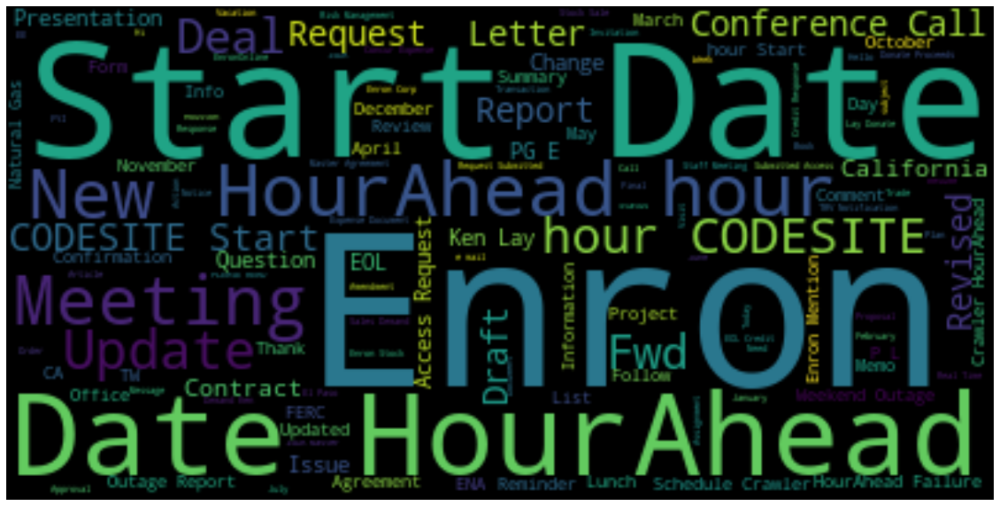

In [107]:
stopwords = set(STOPWORDS)
stopwords.update(["Re", "FW"])
textt = " ".join(review for review in Subject_data.Subject)
wordcloud = WordCloud(stopwords=stopwords).generate(textt)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [108]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
vaderAnalyzer = SentimentIntensityAnalyzer()

In [109]:
Subjects = Subject_data['Subject'].to_string()


In [110]:
print(Subjects[:1000000])

0                                                       Re:
1                                                          
2                                                 Re: Hello
3                              Re: PRC review - phone calls
4         FW: fixed forward or other Collar floor gas pr...
5                                                          
6               Consolidated positions: Issues & To Do list
7                                      Re: 2001 Margin Plan
8                                                          
9                Meeting re: Storage Strategies in the West
10                               Re: Not business related..
11                                           San Juan Index
12                                     Investment Structure
13                                                         
14                           Re: Gas Trading Vision meeting
15                          Gas Physical/Financial Position
16                                      

In [116]:
type(Subjects)

str

In [108]:
str(Subjects)

'0                                                       Re:\n1                                                          \n2                                                 Re: Hello\n3                              Re: PRC review - phone calls\n4         FW: fixed forward or other Collar floor gas pr...\n                                ...                        \n258695                       FW: Positions without Sundance\n258696                                                  RE:\n258697                                                  RE:\n258698                                           Gas Hedges\n258699                            Calgary Analyst/Associate\nName: Subject, Length: 258700, dtype: object'

In [111]:
word_tokens = word_tokenize(Subjects) 
print(word_tokens[10])

:


In [112]:
print(word_tokens[:15])

['0', 'Re', ':', '1', '2', 'Re', ':', 'Hello', '3', 'Re', ':', 'PRC', 'review', '-', 'phone']


In [113]:
filtered_sentence = [w for w in word_tokens if not w in stopwords]  
  
filtered_sentence = []  
  
for w in word_tokens:  
    if w not in stopwords:  
        filtered_sentence.append(w)  
  
#print(word_tokens)  
print(filtered_sentence[90])

28


In [ ]:
result = re.sub(r'[0-9]+', '', )

In [120]:
   
def listToString(s):  
    
    
    str1 = " " 
    
    
    return (str1.join(s))

In [148]:
fitered = listToString(filtered_sentence) 

In [154]:
result = re.sub(r'[0-9]+', '', fitered)
result = re.sub(r'/:+', '', result)
len(result)

6754896

In [150]:
result = re.sub(r':+', '', fitered)

In [155]:
result = re.sub('[,|:|;|\.|?|!|(|)]+', '', result)

In [158]:
result = re.sub('    ', '', result)

In [160]:
len(result)

6319153

In [159]:
print(result[:100])

 Hello   PRC review - phone calls   fixed forward Collar floor gas prConsolidated positions  Issues 


In [174]:
trying =result[:1000000]

In [175]:
scores = vaderAnalyzer.polarity_scores(trying)

In [170]:
print(scores)

{'neg': 0.034, 'neu': 0.837, 'pos': 0.129, 'compound': 1.0}
